In [30]:
import os, glob, random, shutil
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout, BatchNormalization, Multiply, Add
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import jaccard_score

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.18.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
class HeartSegmentationDataHandler:
    def __init__(self, images_dir, masks_dir, val_split=0.2, test_split=0.1, random_state=42):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.val_split = val_split
        self.test_split = test_split
        self.random_state = random_state
        self.train_pairs = None
        self.val_pairs = None
        self.test_pairs = None
        
    def load_file_paths(self):
        """Load and split image and mask file paths into train/val/test"""
        image_paths = sorted(glob.glob(os.path.join(self.images_dir, '*')))
        mask_paths = sorted(glob.glob(os.path.join(self.masks_dir, '*')))
        
        print(f"Found {len(image_paths)} images and {len(mask_paths)} masks")
        
        if len(image_paths) != len(mask_paths):
            raise ValueError("Number of images and masks don't match!")
        
        # Combine paths
        combined = list(zip(image_paths, mask_paths))
        
        # First split: separate test set
        train_val_pairs, self.test_pairs = train_test_split(
            combined, test_size=self.test_split, random_state=self.random_state
        )
        
        # Second split: separate train and validation from remaining data
        val_size_adjusted = self.val_split / (1 - self.test_split)  # Adjust val_split for remaining data
        self.train_pairs, self.val_pairs = train_test_split(
            train_val_pairs, test_size=val_size_adjusted, random_state=self.random_state
        )
        
        print(f"Training pairs: {len(self.train_pairs)}")
        print(f"Validation pairs: {len(self.val_pairs)}")
        print(f"Test pairs: {len(self.test_pairs)}")
        
        return self.train_pairs, self.val_pairs, self.test_pairs
    
    def preprocess_image_mask(self, img_path, mask_path, target_size=(512, 512), normalize=True):
        """Preprocess a single image-mask pair"""
        # Load image and mask
        img = np.array(Image.open(img_path).convert('L'))
        mask = np.array(Image.open(mask_path).convert('L'))
        
        # Resize if necessary
        if img.shape != target_size:
            img = np.array(Image.fromarray(img).resize(target_size))
        if mask.shape != target_size:
            mask = np.array(Image.fromarray(mask).resize(target_size))
        
        # Normalize image
        if normalize:
            img = img.astype(np.float32) / 255.0
        else:
            img = img.astype(np.float32)
        
        # Convert mask to binary (255 -> 1, others -> 0)
        mask_bin = (mask == 255).astype(np.float32)
        
        # Add channel dimension
        img = img[..., np.newaxis]
        mask_bin = mask_bin[..., np.newaxis]
        
        return img, mask_bin
    
    def load_data(self, pairs, target_size=(512, 512), normalize=True):
        """Load and preprocess multiple image-mask pairs"""
        images = []
        masks = []
        
        for img_path, mask_path in pairs:
            img, mask = self.preprocess_image_mask(img_path, mask_path, target_size, normalize)
            images.append(img)
            masks.append(mask)
        
        return np.array(images), np.array(masks)
    
    def get_train_val_test_data(self, target_size=(512, 512), normalize=True):
        """Get preprocessed training, validation, and test data"""
        if self.train_pairs is None or self.val_pairs is None or self.test_pairs is None:
            raise ValueError("File paths not loaded. Call load_file_paths() first.")
        
        print("Loading training data...")
        x_train, y_train = self.load_data(self.train_pairs, target_size, normalize)
        
        print("Loading validation data...")
        x_val, y_val = self.load_data(self.val_pairs, target_size, normalize)
        
        print("Loading test data...")
        x_test, y_test = self.load_data(self.test_pairs, target_size, normalize)
        
        print(f"Training data shape: {x_train.shape}, {y_train.shape}")
        print(f"Validation data shape: {x_val.shape}, {y_val.shape}")
        print(f"Test data shape: {x_test.shape}, {y_test.shape}")
        print(f"Data range - Images: [{x_train.min():.3f}, {x_train.max():.3f}], Masks: [{y_train.min():.3f}, {y_train.max():.3f}]")
        
        return x_train, y_train, x_val, y_val, x_test, y_test

In [24]:
class UNetModel:
    def __init__(self, input_shape=(512, 512, 1), num_classes=1):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.model = None
        self.history = None
    
    def conv_block(self, inputs, num_filters, dropout_rate=0.1):
        """Convolutional block with BatchNorm and Dropout"""
        conv = Conv2D(num_filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
        conv = BatchNormalization()(conv)
        conv = Dropout(dropout_rate)(conv)
        conv = Conv2D(num_filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv)
        conv = BatchNormalization()(conv)
        return conv
    
    def encoder_block(self, inputs, num_filters, dropout_rate=0.1):
        """Encoder block: conv_block + max pooling"""
        conv = self.conv_block(inputs, num_filters, dropout_rate)
        pool = MaxPooling2D(pool_size=(2, 2))(conv)
        return conv, pool
    
    def decoder_block(self, inputs, skip_features, num_filters, dropout_rate=0.1):
        """Decoder block: upsampling + concatenation + conv_block"""
        up = UpSampling2D(size=(2, 2))(inputs)
        up = Conv2D(num_filters, 2, activation='relu', padding='same')(up)
        
        # Concatenate with skip connection
        concat = concatenate([up, skip_features])
        conv = self.conv_block(concat, num_filters, dropout_rate)
        return conv
    
    def build_model(self):
        """Build U-Net architecture"""
        inputs = Input(self.input_shape)
        
        # Encoder path
        s1, p1 = self.encoder_block(inputs, 64, 0.1)
        s2, p2 = self.encoder_block(p1, 128, 0.1)
        s3, p3 = self.encoder_block(p2, 256, 0.2)
        s4, p4 = self.encoder_block(p3, 512, 0.2)
        
        # Bottleneck
        b1 = self.conv_block(p4, 1024, 0.3)
        
        # Decoder path
        d1 = self.decoder_block(b1, s4, 512, 0.2)
        d2 = self.decoder_block(d1, s3, 256, 0.2)
        d3 = self.decoder_block(d2, s2, 128, 0.1)
        d4 = self.decoder_block(d3, s1, 64, 0.1)
        
        # Output layer
        outputs = Conv2D(self.num_classes, 1, activation='sigmoid')(d4)
        
        self.model = Model(inputs, outputs, name='U-Net')
        return self.model
    
    @staticmethod
    def dice_coefficient(y_true, y_pred, smooth=1e-6):
        """Dice coefficient for binary segmentation"""
        y_true_f = tf.keras.backend.flatten(y_true)
        y_pred_f = tf.keras.backend.flatten(y_pred)
        intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
        return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)
    
    @staticmethod
    def dice_loss(y_true, y_pred):
        """Dice loss for training"""
        return 1 - UNetModel.dice_coefficient(y_true, y_pred)
    
    @staticmethod
    def combined_loss(y_true, y_pred):
        """Combined Binary Crossentropy and Dice loss"""
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        dice = UNetModel.dice_loss(y_true, y_pred)
        return bce + dice
    
    @staticmethod
    def iou_coefficient(y_true, y_pred, smooth=1e-6):
        """IoU (Jaccard) coefficient"""
        y_true_f = tf.keras.backend.flatten(y_true)
        y_pred_f = tf.keras.backend.flatten(y_pred)
        intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
        union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
        return (intersection + smooth) / (union + smooth)
    
    def compile_model(self, learning_rate=1e-4):
        """Compile the model with loss and metrics"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        
        self.model.compile(
            optimizer=Adam(learning_rate=learning_rate),
            loss=self.combined_loss,
            metrics=['accuracy', self.dice_coefficient, self.iou_coefficient]
        )
    
    def get_callbacks(self, checkpoint_path='best_unet_heart_segmentation.h5'):
        """Get training callbacks"""
        callbacks = [
            ModelCheckpoint(
                checkpoint_path,
                monitor='val_dice_coefficient',
                mode='max',
                save_best_only=True,
                verbose=1
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=10,
                min_lr=1e-7,
                verbose=1
            ),
            EarlyStopping(
                monitor='val_dice_coefficient',
                mode='max',
                patience=20,
                restore_best_weights=True,
                verbose=1
            )
        ]
        return callbacks
    
    def train(self, x_train, y_train, x_val, y_val, batch_size=8, epochs=100, callbacks=None):
        """Train the model"""
        if self.model is None:
            raise ValueError("Model not built and compiled. Call build_model() and compile_model() first.")
        
        if callbacks is None:
            callbacks = self.get_callbacks()
        
        print("Starting training...")
        self.history = self.model.fit(
            x_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(x_val, y_val),
            callbacks=callbacks,
            verbose=1
        )
        
        return self.history
    
    def predict(self, x_data, threshold=0.5):
        """Make predictions on input data"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        
        predictions = self.model.predict(x_data)
        binary_predictions = (predictions > threshold).astype(np.float32)
        return predictions, binary_predictions
    
    def evaluate_test_set(self, x_test, y_test, threshold=0.5):
        """Evaluate model on test set and calculate metrics"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        
        print("Evaluating on test set...")
        
        # Get predictions
        pred_probs, pred_binary = self.predict(x_test, threshold)
        
        # Calculate metrics using Keras model
        test_loss, test_acc, test_dice, test_iou = self.model.evaluate(x_test, y_test, verbose=0)
        
        # Calculate additional metrics manually for verification
        dice_scores = []
        iou_scores = []
        
        for i in range(len(y_test)):
            y_true_flat = y_test[i].flatten()
            y_pred_flat = pred_binary[i].flatten()
            
            # Dice coefficient
            intersection = np.sum(y_true_flat * y_pred_flat)
            dice = (2. * intersection) / (np.sum(y_true_flat) + np.sum(y_pred_flat) + 1e-6)
            dice_scores.append(dice)
            
            # IoU coefficient
            union = np.sum(y_true_flat) + np.sum(y_pred_flat) - intersection
            iou = intersection / (union + 1e-6)
            iou_scores.append(iou)
        
        results = {
            'test_loss': test_loss,
            'test_accuracy': test_acc,
            'test_dice_keras': test_dice,
            'test_iou_keras': test_iou,
            'dice_scores': dice_scores,
            'iou_scores': iou_scores,
            'mean_dice': np.mean(dice_scores),
            'std_dice': np.std(dice_scores),
            'mean_iou': np.mean(iou_scores),
            'std_iou': np.std(iou_scores),
            'predictions': pred_probs,
            'binary_predictions': pred_binary
        }
        
        return results

    def load_weights(self, weights_path):
        """Load model weights from a file"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        self.model.load_weights(weights_path)
        print(f"Loaded weights from {weights_path}")

    def predict_and_save_masks(self, input_folder, output_folder, threshold=0.5, input_size=(512, 512)):
        """
        Process all images in input folder, make predictions, and save masks to output folder.
        
        Args:
            input_folder (str): Path to folder containing input images
            output_folder (str): Path to folder where prediction masks will be saved
            threshold (float): Threshold for binarizing predictions (default: 0.5)
            input_size (tuple): Size to resize input images to (default: (512, 512))
            
        Returns:
            None
        """
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
            
        # Clean output folder by completely removing it and recreating
        print(f"Cleaning output folder: {output_folder}")
        try:
            if os.path.exists(output_folder):
                shutil.rmtree(output_folder)
            os.makedirs(output_folder, exist_ok=True)
        except Exception as e:
            print(f"Failed to clean output folder {output_folder}. Reason: {e}")
            return
        
        # Get all image files in input folder
        image_extensions = ('*.jpg', '*.jpeg', '*.png',)
        image_paths = []
        for ext in image_extensions:
            image_paths.extend(glob.glob(os.path.join(input_folder, ext)))
            
        if not image_paths:
            print(f"No images found in {input_folder} with extensions {image_extensions}")
            return
            
        print(f"Found {len(image_paths)} images to process")
        
        # Process each image
        for i, image_path in enumerate(image_paths):
            try:
                # Load and preprocess image
                img = Image.open(image_path)
                img = img.convert('L')  # Convert to grayscale
                img = img.resize(input_size)
                img_array = np.array(img) / 255.0
                img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
                img_array = np.expand_dims(img_array, axis=-1)  # Add channel dimension
                
                # Make prediction
                prediction = self.model.predict(img_array)
                binary_mask = (prediction[0,...,0] > threshold).astype(np.uint8) * 255
                
                # Save mask
                mask_filename = os.path.splitext(os.path.basename(image_path))[0] + '.png'
                mask_path = os.path.join(output_folder, mask_filename)
                mask_img = Image.fromarray(binary_mask)
                mask_img.save(mask_path)
                
                print(f"Processed {i+1}/{len(image_paths)}: {image_path} -> {mask_path}")
                
            except Exception as e:
                print(f"Error processing {image_path}: {str(e)}")
                
        print("Finished processing all images")

In [4]:
class AttentionUNetModel:
    def __init__(self, input_shape=(512, 512, 1), num_classes=1):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.model = None
        self.history = None
    
    def attention_gate(self, gating_signal, skip_connection, inter_channels):
        """
        Attention Gate mechanism
        Args:
            gating_signal: Output from decoder (coarser scale)
            skip_connection: Skip connection from encoder (finer scale)
            inter_channels: Number of intermediate channels
        """
        # Gating signal transformation
        theta_g = Conv2D(inter_channels, 1, strides=1, padding='same', 
                        kernel_initializer='he_normal')(gating_signal)
        
        # Skip connection transformation
        phi_x = Conv2D(inter_channels, 1, strides=1, padding='same', 
                      kernel_initializer='he_normal')(skip_connection)
        
        # Element-wise addition and ReLU activation
        add_xg = Add()([theta_g, phi_x])
        add_xg = tf.keras.activations.relu(add_xg)
        
        # 1x1 convolution to get attention coefficients
        psi = Conv2D(1, 1, strides=1, padding='same', 
                    kernel_initializer='he_normal')(add_xg)
        psi = tf.keras.activations.sigmoid(psi)
        
        # Apply attention coefficients to skip connection
        attended_x = Multiply()([skip_connection, psi])
        
        return attended_x
    
    def conv_block(self, inputs, num_filters, dropout_rate=0.1):
        """Convolutional block with BatchNorm and Dropout"""
        conv = Conv2D(num_filters, 3, activation='relu', padding='same', 
                     kernel_initializer='he_normal')(inputs)
        conv = BatchNormalization()(conv)
        conv = Dropout(dropout_rate)(conv)
        conv = Conv2D(num_filters, 3, activation='relu', padding='same', 
                     kernel_initializer='he_normal')(conv)
        conv = BatchNormalization()(conv)
        return conv
    
    def encoder_block(self, inputs, num_filters, dropout_rate=0.1):
        """Encoder block: conv_block + max pooling"""
        conv = self.conv_block(inputs, num_filters, dropout_rate)
        pool = MaxPooling2D(pool_size=(2, 2))(conv)
        return conv, pool
    
    def decoder_block_with_attention(self, inputs, skip_features, num_filters, dropout_rate=0.1):
        """Decoder block with attention mechanism"""
        # Upsampling
        up = UpSampling2D(size=(2, 2))(inputs)
        up = Conv2D(num_filters, 2, activation='relu', padding='same', 
                   kernel_initializer='he_normal')(up)
        
        # Apply attention gate
        attended_skip = self.attention_gate(
            gating_signal=up, 
            skip_connection=skip_features, 
            inter_channels=num_filters // 2
        )
        
        # Concatenate with attended skip connection
        concat = concatenate([up, attended_skip])
        conv = self.conv_block(concat, num_filters, dropout_rate)
        return conv
    
    def build_model(self):
        """Build Attention U-Net architecture"""
        inputs = Input(self.input_shape)
        
        # Encoder path
        s1, p1 = self.encoder_block(inputs, 64, 0.1)
        s2, p2 = self.encoder_block(p1, 128, 0.1)
        s3, p3 = self.encoder_block(p2, 256, 0.2)
        s4, p4 = self.encoder_block(p3, 512, 0.2)
        
        # Bottleneck
        b1 = self.conv_block(p4, 1024, 0.3)
        
        # Decoder path with attention gates
        d1 = self.decoder_block_with_attention(b1, s4, 512, 0.2)
        d2 = self.decoder_block_with_attention(d1, s3, 256, 0.2)
        d3 = self.decoder_block_with_attention(d2, s2, 128, 0.1)
        d4 = self.decoder_block_with_attention(d3, s1, 64, 0.1)
        
        # Output layer
        outputs = Conv2D(self.num_classes, 1, activation='sigmoid')(d4)
        
        self.model = tf.keras.models.Model(inputs, outputs, name='Attention-U-Net')
        return self.model
    
    @staticmethod
    def dice_coefficient(y_true, y_pred, smooth=1e-6):
        """Dice coefficient for binary segmentation"""
        y_true_f = tf.keras.backend.flatten(y_true)
        y_pred_f = tf.keras.backend.flatten(y_pred)
        intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
        return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)
    
    @staticmethod
    def dice_loss(y_true, y_pred):
        """Dice loss for training"""
        return 1 - AttentionUNetModel.dice_coefficient(y_true, y_pred)
    
    @staticmethod
    def combined_loss(y_true, y_pred):
        """Combined Binary Crossentropy and Dice loss"""
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        dice = AttentionUNetModel.dice_loss(y_true, y_pred)
        return bce + dice
    
    @staticmethod
    def iou_coefficient(y_true, y_pred, smooth=1e-6):
        """IoU (Jaccard) coefficient"""
        y_true_f = tf.keras.backend.flatten(y_true)
        y_pred_f = tf.keras.backend.flatten(y_pred)
        intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
        union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
        return (intersection + smooth) / (union + smooth)
    
    def compile_model(self, learning_rate=1e-4):
        """Compile the model with loss and metrics"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
            loss=self.combined_loss,
            metrics=['accuracy', self.dice_coefficient, self.iou_coefficient]
        )
    
    def get_callbacks(self, checkpoint_path='best_attention_unet_heart_segmentation.h5'):
        """Get training callbacks"""
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                checkpoint_path,
                monitor='val_dice_coefficient',
                mode='max',
                save_best_only=True,
                verbose=1
            ),
            tf.keras.callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=10,
                min_lr=1e-7,
                verbose=1
            ),
            tf.keras.callbacks.EarlyStopping(
                monitor='val_dice_coefficient',
                mode='max',
                patience=20,
                restore_best_weights=True,
                verbose=1
            )
        ]
        return callbacks
    
    def train(self, x_train, y_train, x_val, y_val, batch_size=8, epochs=100, callbacks=None):
        """Train the model"""
        if self.model is None:
            raise ValueError("Model not built and compiled. Call build_model() and compile_model() first.")
        
        if callbacks is None:
            callbacks = self.get_callbacks()
        
        print("Starting Attention U-Net training...")
        self.history = self.model.fit(
            x_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(x_val, y_val),
            callbacks=callbacks,
            verbose=1
        )
        
        return self.history
    
    def predict(self, x_data, threshold=0.5):
        """Make predictions on input data"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        
        predictions = self.model.predict(x_data)
        binary_predictions = (predictions > threshold).astype(np.float32)
        return predictions, binary_predictions
    
    def evaluate_test_set(self, x_test, y_test, threshold=0.5):
        """Evaluate model on test set and calculate metrics"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        
        print("Evaluating Attention U-Net on test set...")
        
        # Get predictions
        pred_probs, pred_binary = self.predict(x_test, threshold)
        
        # Calculate metrics using Keras model
        test_loss, test_acc, test_dice, test_iou = self.model.evaluate(x_test, y_test, verbose=0)
        
        # Calculate additional metrics manually for verification
        dice_scores = []
        iou_scores = []
        
        for i in range(len(y_test)):
            y_true_flat = y_test[i].flatten()
            y_pred_flat = pred_binary[i].flatten()
            
            # Dice coefficient
            intersection = np.sum(y_true_flat * y_pred_flat)
            dice = (2. * intersection) / (np.sum(y_true_flat) + np.sum(y_pred_flat) + 1e-6)
            dice_scores.append(dice)
            
            # IoU coefficient
            union = np.sum(y_true_flat) + np.sum(y_pred_flat) - intersection
            iou = intersection / (union + 1e-6)
            iou_scores.append(iou)
        
        results = {
            'test_loss': test_loss,
            'test_accuracy': test_acc,
            'test_dice_keras': test_dice,
            'test_iou_keras': test_iou,
            'dice_scores': dice_scores,
            'iou_scores': iou_scores,
            'mean_dice': np.mean(dice_scores),
            'std_dice': np.std(dice_scores),
            'mean_iou': np.mean(iou_scores),
            'std_iou': np.std(iou_scores),
            'predictions': pred_probs,
            'binary_predictions': pred_binary
        }
        
        return results
    
    def save_model(self, filepath):
        """Save the entire model (architecture + weights)"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        self.model.save(filepath)
        print(f"Model saved to {filepath}")
    
    def load_model(self, filepath):
        """Load a saved model (architecture + weights)"""
        # Define custom objects for loading
        custom_objects = {
            'combined_loss': self.combined_loss,
            'dice_coefficient': self.dice_coefficient,
            'iou_coefficient': self.iou_coefficient,
            'dice_loss': self.dice_loss
        }
        
        self.model = tf.keras.models.load_model(filepath, custom_objects=custom_objects)
        print(f"Model loaded from {filepath}")
        return self.model
    
    def load_weights(self, weights_path):
        """Load only weights into an existing model architecture"""
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")
        
        self.model.load_weights(weights_path)
        print(f"Weights loaded from {weights_path}")

In [20]:
class Visualizer:
    def __init__(self):
        pass
    
    @staticmethod
    def plot_training_history(history):
        """Plot training and validation metrics"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
        # Loss
        axes[0, 0].plot(history.history['loss'], label='Training Loss')
        axes[0, 0].plot(history.history['val_loss'], label='Validation Loss')
        axes[0, 0].set_title('Model Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True)
        
        # Accuracy
        axes[0, 1].plot(history.history['accuracy'], label='Training Accuracy')
        axes[0, 1].plot(history.history['val_accuracy'], label='Validation Accuracy')
        axes[0, 1].set_title('Model Accuracy')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Accuracy')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
        
        # Dice Coefficient
        axes[1, 0].plot(history.history['dice_coefficient'], label='Training Dice')
        axes[1, 0].plot(history.history['val_dice_coefficient'], label='Validation Dice')
        axes[1, 0].set_title('Dice Coefficient')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Dice Coefficient')
        axes[1, 0].legend()
        axes[1, 0].grid(True)
        
        # IoU Coefficient
        axes[1, 1].plot(history.history['iou_coefficient'], label='Training IoU')
        axes[1, 1].plot(history.history['val_iou_coefficient'], label='Validation IoU')
        axes[1, 1].set_title('IoU Coefficient')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].set_ylabel('IoU Coefficient')
        axes[1, 1].legend()
        axes[1, 1].grid(True)
        
        plt.tight_layout()
        plt.savefig('training_history.png')
        plt.show()
    
    @staticmethod
    def visualize_test_results(x_test, y_test, predictions, binary_predictions, 
                              dice_scores, iou_scores, num_samples=6, threshold=0.5):
        """Visualize test results with metrics"""
        fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
        if num_samples == 1:
            axes = axes.reshape(1, -1)
        
        for i in range(num_samples):
            # Original image
            axes[i, 0].imshow(x_test[i].squeeze(), cmap='gray')
            axes[i, 0].set_title('Original Image')
            axes[i, 0].axis('off')
            
            # Ground truth mask
            axes[i, 1].imshow(y_test[i].squeeze(), cmap='gray')
            axes[i, 1].set_title('Ground Truth')
            axes[i, 1].axis('off')
            
            # Predicted probability map
            axes[i, 2].imshow(predictions[i].squeeze(), cmap='viridis', vmin=0, vmax=1)
            axes[i, 2].set_title('Prediction Probability')
            axes[i, 2].axis('off')
            
            # Binary prediction with metrics
            axes[i, 3].imshow(binary_predictions[i].squeeze(), cmap='gray')
            dice_score = dice_scores[i]
            iou_score = iou_scores[i]
            axes[i, 3].set_title(f'Binary Pred\nDice: {dice_score:.3f}\nIoU: {iou_score:.3f}')
            axes[i, 3].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    @staticmethod
    def plot_test_metrics_distribution(dice_scores, iou_scores):
        """Plot distribution of test metrics"""
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        
        # Dice scores distribution
        axes[0].hist(dice_scores, bins=15, alpha=0.7, color='blue', edgecolor='black')
        axes[0].axvline(np.mean(dice_scores), color='red', linestyle='--', 
                       label=f'Mean: {np.mean(dice_scores):.3f}')
        axes[0].set_title('Dice Coefficient Distribution')
        axes[0].set_xlabel('Dice Coefficient')
        axes[0].set_ylabel('Frequency')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)
        
        # IoU scores distribution
        axes[1].hist(iou_scores, bins=15, alpha=0.7, color='green', edgecolor='black')
        axes[1].axvline(np.mean(iou_scores), color='red', linestyle='--', 
                       label=f'Mean: {np.mean(iou_scores):.3f}')
        axes[1].set_title('IoU Coefficient Distribution')
        axes[1].set_xlabel('IoU Coefficient')
        axes[1].set_ylabel('Frequency')
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('test_metrics_distribution.png')
        plt.show()
    
    @staticmethod
    def print_test_summary(results):
        """Print comprehensive test results summary"""
        print("="*60)
        print("TEST SET EVALUATION RESULTS")
        print("="*60)
        print(f"Test Loss: {results['test_loss']:.4f}")
        print(f"Test Accuracy: {results['test_accuracy']:.4f}")
        print(f"Test Dice (Keras): {results['test_dice_keras']:.4f}")
        print(f"Test IoU (Keras): {results['test_iou_keras']:.4f}")
        print("-"*40)
        print("DETAILED METRICS:")
        print(f"Mean Dice Score: {results['mean_dice']:.4f} ± {results['std_dice']:.4f}")
        print(f"Mean IoU Score: {results['mean_iou']:.4f} ± {results['std_iou']:.4f}")
        print(f"Best Dice Score: {np.max(results['dice_scores']):.4f}")
        print(f"Worst Dice Score: {np.min(results['dice_scores']):.4f}")
        print(f"Best IoU Score: {np.max(results['iou_scores']):.4f}")
        print(f"Worst IoU Score: {np.min(results['iou_scores']):.4f}")
        print("="*60)
    
    @staticmethod
    def visualize_predictions(model, x_val, y_val, num_samples=4, threshold=0.5):
        """Visualize model predictions"""
        predictions = model.predict(x_val[:num_samples])
        
        fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))
        if num_samples == 1:
            axes = axes.reshape(1, -1)
        
        for i in range(num_samples):
            # Original image
            axes[i, 0].imshow(x_val[i].squeeze(), cmap='gray')
            axes[i, 0].set_title('Original Image')
            axes[i, 0].axis('off')
            
            # Ground truth mask
            axes[i, 1].imshow(y_val[i].squeeze(), cmap='gray')
            axes[i, 1].set_title('Ground Truth Mask')
            axes[i, 1].axis('off')
            
            # Predicted mask
            pred_mask = (predictions[i].squeeze() > threshold).astype(np.float32)
            axes[i, 2].imshow(pred_mask, cmap='gray')
            axes[i, 2].set_title(f'Predicted Mask (th={threshold})')
            axes[i, 2].axis('off')
        
        plt.tight_layout()
        plt.savefig("predictions.png")
        plt.show()
    
    @staticmethod
    def plot_sample_data(x_train, y_train, num_samples=4):
        """Plot sample training data"""
        fig, axes = plt.subplots(num_samples, 2, figsize=(8, 4*num_samples))
        if num_samples == 1:
            axes = axes.reshape(1, -1)
        
        for i in range(num_samples):
            # Image
            axes[i, 0].imshow(x_train[i].squeeze(), cmap='gray')
            axes[i, 0].set_title(f'Training Image {i+1}')
            axes[i, 0].axis('off')
            
            # Mask
            axes[i, 1].imshow(y_train[i].squeeze(), cmap='gray')
            axes[i, 1].set_title(f'Training Mask {i+1}')
            axes[i, 1].axis('off')
        
        plt.tight_layout()
        plt.show()

In [5]:
class ModelLoader:
    """Utility class for loading trained models"""
    
    @staticmethod
    def load_unet_model(weights_path, input_shape=(512, 512, 1)):
        """Load a trained U-Net model with weights"""
        print(f"Loading U-Net model from {weights_path}")
        
        # Create model instance
        unet = UNetModel(input_shape=input_shape)
        model = unet.build_model()
        unet.compile_model()
        
        # Load weights
        unet.load_weights(weights_path)
        
        return unet
    
    @staticmethod
    def load_attention_unet_model(weights_path, input_shape=(512, 512, 1)):
        """Load a trained Attention U-Net model with weights"""
        print(f"Loading Attention U-Net model from {weights_path}")
        
        # Create model instance
        attention_unet = AttentionUNetModel(input_shape=input_shape)
        model = attention_unet.build_model()
        attention_unet.compile_model()
        
        # Load weights
        attention_unet.load_weights(weights_path)
        
        return attention_unet
    
    @staticmethod
    def load_any_model(model_path):
        """Load a complete saved model (architecture + weights)"""
        custom_objects = {
            'combined_loss': UNetModel.combined_loss,
            'dice_coefficient': UNetModel.dice_coefficient,
            'iou_coefficient': UNetModel.iou_coefficient,
            'dice_loss': UNetModel.dice_loss
        }
        
        model = tf.keras.models.load_model(model_path, custom_objects=custom_objects)
        print(f"Complete model loaded from {model_path}")
        return model

In [7]:
CONFIG = {
    'images_dir': "/kaggle/input/cxr-heart-brightness-traditional/images",
    'masks_dir': "/kaggle/input/cxr-heart-brightness-traditional/masks",
    'val_split': 0.15,
    'test_split': 0.1,
    'target_size': (512, 512),
    'batch_size': 2,
    'epochs': 100,
    'learning_rate': 1e-4,
    'checkpoint_path': 'heart_unet_on_traditional_brightness_augmented_data.h5'
}

# Initialize data handler
data_handler = HeartSegmentationDataHandler(
    CONFIG['images_dir'], 
    CONFIG['masks_dir'], 
    CONFIG['val_split'],
    CONFIG['test_split']
)

# Load file paths
train_pairs, val_pairs, test_pairs = data_handler.load_file_paths()

# Load and preprocess data
x_train, y_train, x_val, y_val, x_test, y_test = data_handler.get_train_val_test_data(CONFIG['target_size'])

Found 3053 images and 3053 masks
Training pairs: 2289
Validation pairs: 458
Test pairs: 306
Loading training data...
Loading validation data...
Loading test data...
Training data shape: (2289, 512, 512, 1), (2289, 512, 512, 1)
Validation data shape: (458, 512, 512, 1), (458, 512, 512, 1)
Test data shape: (306, 512, 512, 1), (306, 512, 512, 1)
Data range - Images: [0.000, 1.000], Masks: [0.000, 1.000]


Sample training data:


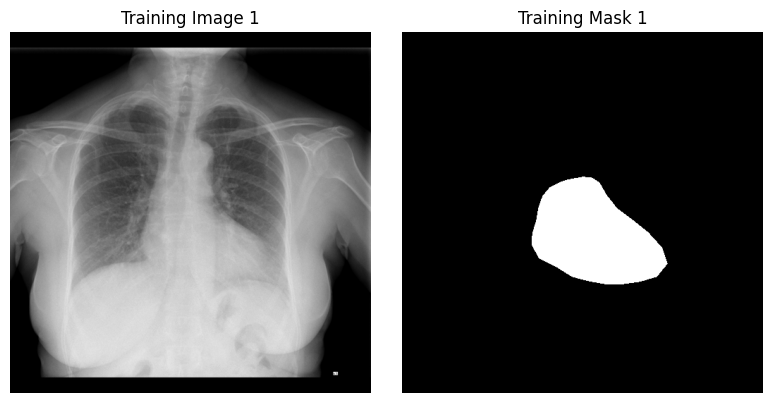

In [22]:
visualizer = Visualizer()
print("Sample training data:")
visualizer.plot_sample_data(x_train, y_train, num_samples=1)

# model

In [9]:
unet = UNetModel(input_shape=(*CONFIG['target_size'], 1))
model = unet.build_model()
unet.compile_model(CONFIG['learning_rate'])

model.summary()

I0000 00:00:1751319056.193638      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 512, 512, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 512, 512, 64)   │            640 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 512, 512, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512, 512, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 512, 512, 64)   │         36,928 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 512, 512, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 256, 256, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 256, 256, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 256, 256, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 256, 256, 128)  │        147,584 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 256, 256, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 128, 128, 128)  │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 256)  │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 128, 128, 256)  │          1,024 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 128, 128, 256)  │              0 │ batch_normalization_4… │
├──────────────────────

 Total params: 31,054,145 (118.46 MB)

 Trainable params: 31,042,369 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
callbacks = unet.get_callbacks(CONFIG['checkpoint_path'])

# Train the model
history = unet.train(
    x_train, y_train, x_val, y_val,
    batch_size=CONFIG['batch_size'],
    epochs=CONFIG['epochs'],
    callbacks=callbacks
)

Starting training...
Epoch 1/100


I0000 00:00:1751319090.151249     102 service.cc:148] XLA service 0x7bdddc04e980 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751319090.152058     102 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1751319092.236622     102 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1751319124.587445     102 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1145/1145 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9067 - dice_coefficient: 0.5444 - iou_coefficient: 0.4014 - loss: 0.8013
Epoch 1: val_dice_coefficient improved from -inf to 0.79721, saving model to heart_unet_on_traditional_brightness_augmented_data.h5
1145/1145 ━━━━━━━━━━━━━━━━━━━━ 423s 321ms/step - accuracy: 0.9068 - dice_coefficient: 0.5445 - iou_coefficient: 0.4015 - loss: 0.8010 - val_accuracy: 0.9715 - val_dice_coefficient: 0.7972 - val_iou_coefficient: 0.6731 - val_loss: 0.3053 - learning_rate: 1.0000e-04
Epoch 2/100
1145/1145 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9874 - dice_coefficient: 0.9024 - iou_coefficient: 0.8235 - loss: 0.1489
Epoch 2: val_dice_coefficient did not improve from 0.79721
1145/1145 ━━━━━━━━━━━━━━━━━━━━ 331s 289ms/step - accuracy: 0.9874 - dice_coefficient: 0.9024 - iou_coefficient: 0.8235 - loss: 0.1489 - val_accuracy: 0.9611 - val_dice_coefficient: 0.7167 - val_iou_coefficient: 0.5834 - val_loss: 0.4673 - learning_rate: 1.0000e-04
Epo

Training completed! Plotting results...


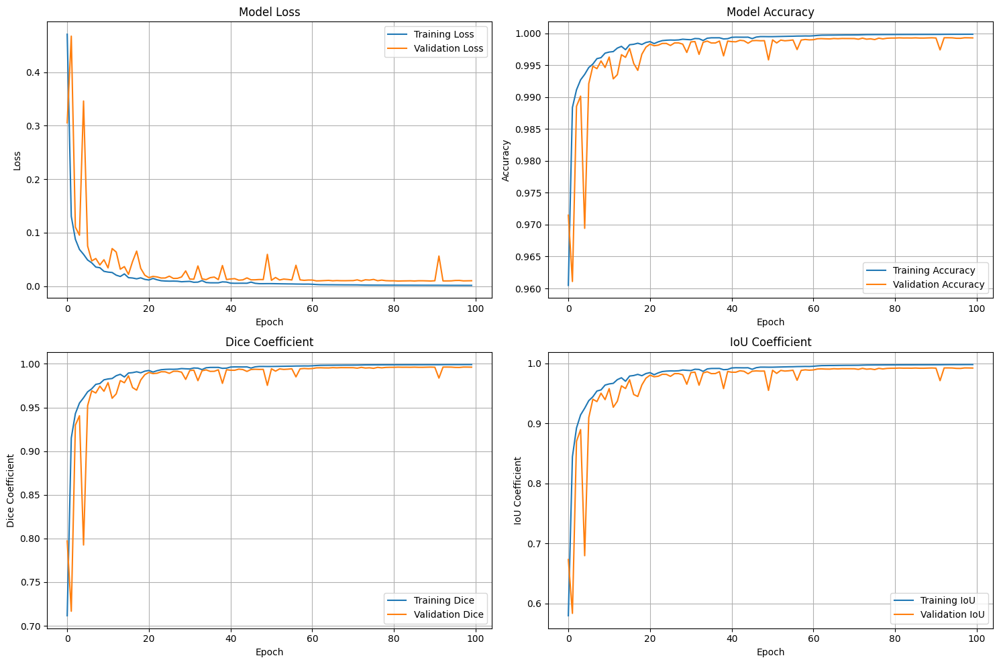

In [23]:
print("Training completed! Plotting results...")
visualizer.plot_training_history(history)

# evaluate model

In [ ]:
print("Evaluating model on test set...")
test_results = unet.evaluate_test_set(x_test, y_test, threshold=0.5)

# Print comprehensive test results
visualizer.print_test_summary(test_results)

# Plot metrics distribution
visualizer.plot_test_metrics_distribution(
    test_results['dice_scores'], 
    test_results['iou_scores']
)

In [ ]:
print("Visualizing predictions on validation data:")
visualizer.visualize_predictions(model, x_val, y_val, num_samples=20)

print(f"Training completed! Best model saved as '{CONFIG['checkpoint_path']}'")

# evaluate pretrained models

Loading U-Net model from /kaggle/input/heart_unet_on_brightness_augmented_data/tensorflow2/default/1/heart_unet_on_brightness_augmented_data.h5
Loaded weights from /kaggle/input/heart_unet_on_brightness_augmented_data/tensorflow2/default/1/heart_unet_on_brightness_augmented_data.h5
Evaluating model on test set...
Evaluating on test set...
10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step
TEST SET EVALUATION RESULTS
Test Loss: 0.1111
Test Accuracy: 0.9906
Test Dice (Keras): 0.9483
Test IoU (Keras): 0.9017
----------------------------------------
DETAILED METRICS:
Mean Dice Score: 0.9483 ± 0.0678
Mean IoU Score: 0.9079 ± 0.0983
Best Dice Score: 0.9927
Worst Dice Score: 0.4426
Best IoU Score: 0.9854
Worst IoU Score: 0.2842


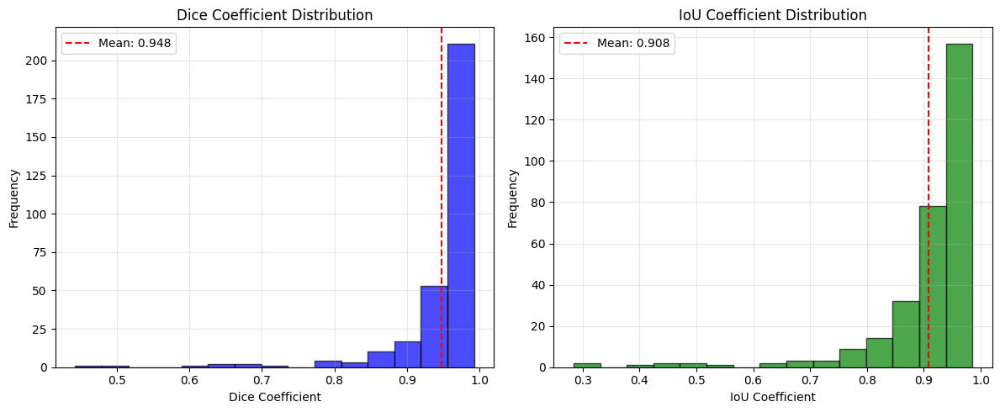

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


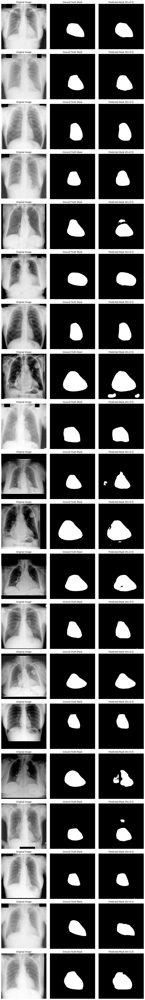

In [33]:
trained_unet = ModelLoader.load_unet_model(
    '/kaggle/input/heart_unet_on_brightness_augmented_data/tensorflow2/default/1/heart_unet_on_brightness_augmented_data.h5')

print("Evaluating model on test set...")
test_results = trained_unet.evaluate_test_set(x_test, y_test, threshold=0.5)
# Print comprehensive test results
visualizer.print_test_summary(test_results)
# Plot metrics distribution
visualizer.plot_test_metrics_distribution(
    test_results['dice_scores'], 
    test_results['iou_scores']
)

predictions, binary_predictions = trained_unet.predict(x_test[:5])
visualizer.visualize_predictions(trained_unet.model, x_test, y_test, num_samples=20)

Loading Attention U-Net model from /kaggle/input/heart_attention_unet_on_brightness_augmented_data/tensorflow2/default/1/heart_attention_unet_on_brightness_augmented_data.h5
Weights loaded from /kaggle/input/heart_attention_unet_on_brightness_augmented_data/tensorflow2/default/1/heart_attention_unet_on_brightness_augmented_data.h5
Evaluating model on test set...
Evaluating Attention U-Net on test set...
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step
TEST SET EVALUATION RESULTS
Test Loss: 0.1019
Test Accuracy: 0.9907
Test Dice (Keras): 0.9376
Test IoU (Keras): 0.8826
----------------------------------------
DETAILED METRICS:
Mean Dice Score: 0.9492 ± 0.0322
Mean IoU Score: 0.9050 ± 0.0555
Best Dice Score: 0.9845
Worst Dice Score: 0.8242
Best IoU Score: 0.9694
Worst IoU Score: 0.7009


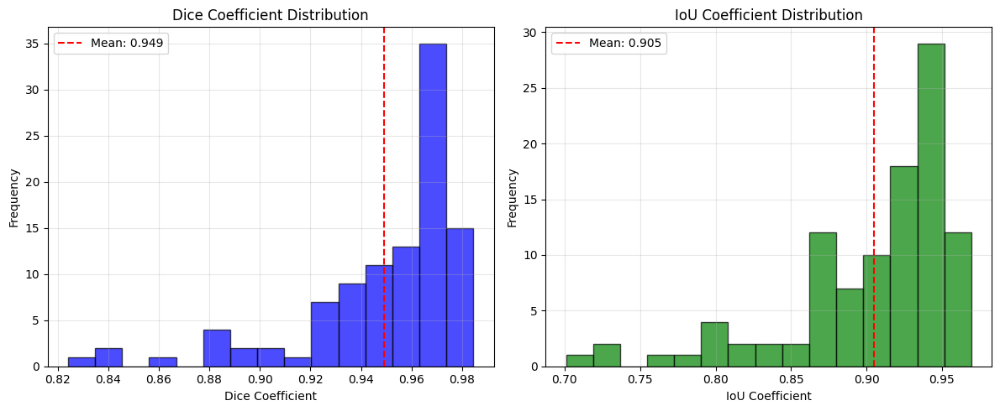

E0000 00:00:1751274578.988688      99 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1751274579.221438      99 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1751274579.607034      99 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1751274579.840025      99 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


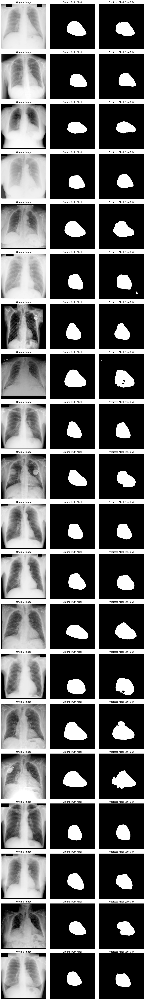

In [34]:
trained_attention_unet = ModelLoader.load_attention_unet_model('/kaggle/input/heart_attention_unet_on_brightness_augmented_data/tensorflow2/default/1/heart_attention_unet_on_brightness_augmented_data.h5')

print("Evaluating model on test set...")
test_results = trained_attention_unet.evaluate_test_set(x_test, y_test, threshold=0.5)
# Print comprehensive test results
visualizer.print_test_summary(test_results)
# Plot metrics distribution
visualizer.plot_test_metrics_distribution(
    test_results['dice_scores'], 
    test_results['iou_scores']
)

predictions, binary_predictions = trained_attention_unet.predict(x_test[:5])
visualizer.visualize_predictions(trained_attention_unet.model, x_test, y_test, num_samples=20)

# save predicted masks

In [34]:
def save_test_masks_and_predictions(data_handler, model, 
                                   y_test_dir, pred_dir, 
                                   threshold=0.5):
    """
    Save test masks (y_test) and model predictions (on x_test) to separate folders.
    
    Args:
        data_handler (HeartSegmentationDataHandler): The data handler instance with test pairs loaded
        model (UNetModel): The trained model instance
        y_test_dir (str): Directory to save ground truth test masks
        pred_dir (str): Directory to save model predictions
        threshold (float): Threshold for binarizing predictions
    """
    # Create output directories if they don't exist
    os.makedirs(y_test_dir, exist_ok=True)
    os.makedirs(pred_dir, exist_ok=True)
    
    # Get test pairs (image_path, mask_path)
    test_pairs = data_handler.test_pairs
    
    # Load test data
    x_test, y_test = data_handler.load_data(test_pairs)
    
    # Get model predictions
    _, binary_predictions = model.predict(x_test, threshold=threshold)
    
    # Save masks and predictions
    for i, (img_path, mask_path) in enumerate(test_pairs):
        try:
            # Get original mask filename
            original_mask_name = os.path.basename(mask_path)
            
            # Save ground truth mask (y_test)
            gt_mask = (y_test[i,...,0] * 255).astype(np.uint8)
            gt_img = Image.fromarray(gt_mask)
            gt_img.save(os.path.join(y_test_dir, original_mask_name))
            
            # Save prediction
            pred_mask = (binary_predictions[i,...,0] * 255).astype(np.uint8)
            pred_img = Image.fromarray(pred_mask)
            pred_img.save(os.path.join(pred_dir, original_mask_name))
            
            print(f"Saved {i+1}/{len(test_pairs)}: {original_mask_name}")
            
        except Exception as e:
            print(f"Error processing {mask_path}: {str(e)}")
    
    print(f"All test masks saved to {y_test_dir}")
    print(f"All predictions saved to {pred_dir}")

In [35]:
trained_unet.predict_and_save_masks("/kaggle/input/cxr-no-heart/images", "/kaggle/working/unet-predictions-on-no-heart-data")

Cleaning output folder: /kaggle/working/unet-predictions-on-no-heart-data
Found 704 images to process
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step
Processed 1/704: /kaggle/input/cxr-no-heart/images/shenzhen-M-1498.png -> /kaggle/working/unet-predictions-on-no-heart-data/shenzhen-M-1498_mask.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Processed 2/704: /kaggle/input/cxr-no-heart/images/shenzhen-F-1171.png -> /kaggle/working/unet-predictions-on-no-heart-data/shenzhen-F-1171_mask.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Processed 3/704: /kaggle/input/cxr-no-heart/images/shenzhen-M-1311.png -> /kaggle/working/unet-predictions-on-no-heart-data/shenzhen-M-1311_mask.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Processed 4/704: /kaggle/input/cxr-no-heart/images/shenzhen-M-1020.png -> /kaggle/working/unet-predictions-on-no-heart-data/shenzhen-M-1020_mask.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Processed 5/704: /kaggle/input/cxr-no-heart/images/shenzhen-F-1301.png -> /kaggle/working/unet-predictions-on-n

In [36]:
save_test_masks_and_predictions(data_handler, trained_unet, "/kaggle/working/test-real-masks", "/kaggle/working/test-predicted-masks")

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
Saved 1/306: jsrt-JPCLN037_aug_clarity_1.png
Saved 2/306: jsrt-JPCLN080_aug_edge_enhancement_2.png
Saved 3/306: jsrt-JPCNN020_aug_gaussian_blur_3.png
Saved 4/306: jsrt-JPCLN082_aug_edge_enhancement_0.png
Saved 5/306: padchest-89871789430838637694883774745784638013_y2t9e8_aug_gaussian_blur_2.png
Saved 6/306: jsrt-JPCLN048_aug_clarity_1-aug4.png
Saved 7/306: jsrt-JPCNN020_aug_edge_enhancement_0-aug7.png
Saved 8/306: padchest-17517381147706809156163698942582418325_tutfbr_aug_clarity_0-aug5.png
Saved 9/306: jsrt-JPCLN063_aug_grid_distortion_3.png
Saved 10/306: padchest-163458460465612645961271966254638198735_8tlhrq_aug_edge_enhancement_2.png
Saved 11/306: padchest-17517381147706809156163698942582418325_tutfbr_aug_grid_distortion_3-aug4.png
Saved 12/306: padchest-287658295007948631772703202498743716060_3yiz93_aug_grid_distortion_1-aug2.png
Saved 13/306: jsrt-JPCLN035_aug_edge_enhancement_2-aug2.png
Saved 14/306: padchest-1787198399529197329121020550712

In [37]:
shutil.make_archive('/kaggle/working/test-real-masks', 'zip', '/kaggle/working/test-real-masks')
shutil.make_archive('/kaggle/working/test-predicted-masks', 'zip', '/kaggle/working/test-predicted-masks')
shutil.make_archive('/kaggle/working/unet-predictions-on-no-heart-data', 'zip', '/kaggle/working/unet-predictions-on-no-heart-data')

'/kaggle/working/unet-predictions-on-no-heart-data.zip'

# plot models

In [39]:
plot_model(trained_attention_unet.model, to_file='heart_attention_.png', show_shapes=True, show_layer_names=True)